## [pyKNEEr](https://github.com/sbonaretti/pyKNEEr)

# [Morphology of Femoral Knee Cartilage](https://sbonaretti.github.io/pyKNEEr/morphology.html)
Content under Creative Commons Attribution license CC-BY-NC-SA 4.0   
Code under GNU-GPL v3 License  
© 2019 Serena Bonaretti
---

Morphology quantifications of femoral cartilage are:  

- *Thickness*, computed in two steps:  
  - Separation of subcondral surface and articular surface of the cartilage
  - Calculation of the distance between the two surfaces using a nearest neighbor method [1]

- *Volume*, calculated as the volume of the cartilage mask multiplied by the image resolution

---

*Automatic data download for the reproducibility of this notebook:*
- Download input images from Zenodo and image file list from GitHub:

In [1]:
import os
import wget
from zipfile import ZipFile 

In [2]:
# local folder  
local_folder_name  = "./OAI2/"
# Zenodo variables
input_URL          = "https://zenodo.org/record/2583184/files/"
zipped_folder_name = "OAI2_segmented_IM.zip" 
# GitHub variables
raw_url            = "https://raw.githubusercontent.com/sbonaretti/pyKNEEr/master/publication/data/"
input_file_name    = "image_list_morphology_OAI2_FU_IM.txt"

In [3]:
# create local folder for dataset
if not os.path.isdir(local_folder_name):
    os.mkdir(local_folder_name)
    print ("folder " + local_folder_name + " created")

folder ./OAI2/ created


In [4]:
# download zipped folder from Zenodo
wget.download(input_URL + zipped_folder_name, local_folder_name + zipped_folder_name) 

'./OAI2/OAI2_segmented_IM.zip'

In [ ]:
# unzip folder
with ZipFile(local_folder_name + zipped_folder_name, 'r') as zip: 
    zip.extractall(local_folder_name) 

In [ ]:
# download input file from GitHub
wget.download(raw_url + input_file_name, "./" + input_file_name)

---

## Import packages

In [1]:
%load_ext autoreload 
%autoreload 2

In [2]:
from pykneer import pykneer_io        as io
from pykneer import morphology_for_nb as morph
%matplotlib inline

## Image information

Inputs:   
- `input_file_name` contains the list of femoral cartilage masks
- `thickness_algo` is the algorithm used to calculate cartilage thickness
- `n_of_cores` is the number of cores used for computations (computations are parallelized for speed)
- `output_file_name_thickness` contains the table with average and standard deviation of thickness
- `output_file_name_volume` contains the table with average volumes

In [3]:
# input_file_name            = "./image_list_morphology_OAI2_FU_IM.txt" # commented out because downloaded from GitHub
thickness_algo             = 1 # 1 for nearest neighbor on bone-cartilage surface 
                               # 2 for nearest neighbor on articular surface
n_of_cores                 = 10
output_file_name_thickness = "thickness_OAI2_FU_IM.csv"
output_file_name_volume    = "volume_OAI2_FU_IM.csv"

#### Read image data
- `image_data` is a dictionary (or struct), where each cell corresponds to an image. For each image, information such as paths and file names are stored  

In [4]:
image_data = io.load_image_data_morphology(input_file_name)

-> image information loaded


---

## Cartilage Thickness

### Separating subcondral surface and articular surface of cartilage

To calculate cartilage thickness, first the cartilage surface is extracted from the binary mask. Then subcondral surface and articular surface are divided in two separate point clouds

In [5]:
morph.separate_cartilage_surfaces(image_data, n_of_cores)

001_FU_IM_fc.mha
004_FU_IM_fc.mha
007_FU_IM_fc.mha
013_FU_IM_fc.mha
016_FU_IM_fc.mha
019_FU_IM_fc.mha
028_FU_IM_fc.mha
010_FU_IM_fc.mha
025_FU_IM_fc.mha
022_FU_IM_fc.mha
011_FU_IM_fc.mha
017_FU_IM_fc.mha
023_FU_IM_fc.mha
026_FU_IM_fc.mha
029_FU_IM_fc.mha
008_FU_IM_fc.mha
005_FU_IM_fc.mha
020_FU_IM_fc.mha
014_FU_IM_fc.mha
012_FU_IM_fc.mha
002_FU_IM_fc.mha
018_FU_IM_fc.mha
024_FU_IM_fc.mha
009_FU_IM_fc.mha
030_FU_IM_fc.mha
027_FU_IM_fc.mha
021_FU_IM_fc.mha
015_FU_IM_fc.mha
006_FU_IM_fc.mha
031_FU_IM_fc.mha
034_FU_IM_fc.mha
037_FU_IM_fc.mha
003_FU_IM_fc.mha
040_FU_IM_fc.mha
043_FU_IM_fc.mha
046_FU_IM_fc.mha
038_FU_IM_fc.mha
049_FU_IM_fc.mha
035_FU_IM_fc.mha
052_FU_IM_fc.mha
044_FU_IM_fc.mha
055_FU_IM_fc.mha
058_FU_IM_fc.mha
032_FU_IM_fc.mha
041_FU_IM_fc.mha
047_FU_IM_fc.mha
039_FU_IM_fc.mha
056_FU_IM_fc.mha
050_FU_IM_fc.mha
053_FU_IM_fc.mha
059_FU_IM_fc.mha
045_FU_IM_fc.mha
033_FU_IM_fc.mha
036_FU_IM_fc.mha
042_FU_IM_fc.mha
048_FU_IM_fc.mha
061_FU_IM_fc.mha
051_FU_IM_fc.mha
064_FU_IM_fc.m

#### Visual check 
Subcondral bone surface (yellow) and articular surface (blue) are visualized as flattened point clouds. The flattening is with respect to a cylinder interpolated into the cartilage surface [2]

001_FU_IM_fc.mha
002_FU_IM_fc.mha
003_FU_IM_fc.mha
004_FU_IM_fc.mha
005_FU_IM_fc.mha
006_FU_IM_fc.mha
007_FU_IM_fc.mha
008_FU_IM_fc.mha
009_FU_IM_fc.mha
010_FU_IM_fc.mha
011_FU_IM_fc.mha
012_FU_IM_fc.mha
013_FU_IM_fc.mha
014_FU_IM_fc.mha
015_FU_IM_fc.mha
016_FU_IM_fc.mha
017_FU_IM_fc.mha
018_FU_IM_fc.mha
019_FU_IM_fc.mha
020_FU_IM_fc.mha
021_FU_IM_fc.mha
022_FU_IM_fc.mha
023_FU_IM_fc.mha
024_FU_IM_fc.mha
025_FU_IM_fc.mha
026_FU_IM_fc.mha
027_FU_IM_fc.mha
028_FU_IM_fc.mha
029_FU_IM_fc.mha
030_FU_IM_fc.mha
031_FU_IM_fc.mha
032_FU_IM_fc.mha
033_FU_IM_fc.mha
034_FU_IM_fc.mha
035_FU_IM_fc.mha
036_FU_IM_fc.mha
037_FU_IM_fc.mha
038_FU_IM_fc.mha
039_FU_IM_fc.mha
040_FU_IM_fc.mha
041_FU_IM_fc.mha
042_FU_IM_fc.mha
043_FU_IM_fc.mha
044_FU_IM_fc.mha
045_FU_IM_fc.mha
046_FU_IM_fc.mha
047_FU_IM_fc.mha
048_FU_IM_fc.mha
049_FU_IM_fc.mha
050_FU_IM_fc.mha
051_FU_IM_fc.mha
052_FU_IM_fc.mha
053_FU_IM_fc.mha
054_FU_IM_fc.mha
055_FU_IM_fc.mha
056_FU_IM_fc.mha
057_FU_IM_fc.mha
058_FU_IM_fc.mha
059_FU_IM_fc.m

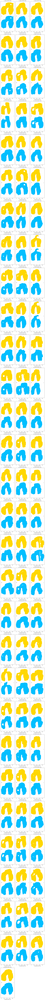

In [6]:
morph.show_cartilage_surfaces(image_data)

### Calculating cartilage thickness

Assign the chosen algorithm 

In [7]:
morph.algorithm(image_data, thickness_algo)

Calculate thickness

In [8]:
morph.calculate_thickness(image_data, n_of_cores)

001_FU_IM_fc.mha
007_FU_IM_fc.mha
004_FU_IM_fc.mha
013_FU_IM_fc.mha
010_FU_IM_fc.mha
019_FU_IM_fc.mha
016_FU_IM_fc.mha
022_FU_IM_fc.mha
025_FU_IM_fc.mha
028_FU_IM_fc.mha
011_FU_IM_fc.mha
017_FU_IM_fc.mha
026_FU_IM_fc.mha
023_FU_IM_fc.mha
012_FU_IM_fc.mha
029_FU_IM_fc.mha
005_FU_IM_fc.mha
008_FU_IM_fc.mha
014_FU_IM_fc.mha
020_FU_IM_fc.mha
024_FU_IM_fc.mha
027_FU_IM_fc.mha
030_FU_IM_fc.mha
009_FU_IM_fc.mha
031_FU_IM_fc.mha
021_FU_IM_fc.mha
015_FU_IM_fc.mha
018_FU_IM_fc.mha
034_FU_IM_fc.mha
002_FU_IM_fc.mha
037_FU_IM_fc.mha
006_FU_IM_fc.mha
040_FU_IM_fc.mha
043_FU_IM_fc.mha
038_FU_IM_fc.mha
046_FU_IM_fc.mha
003_FU_IM_fc.mha
049_FU_IM_fc.mha
032_FU_IM_fc.mha
052_FU_IM_fc.mha
035_FU_IM_fc.mha
044_FU_IM_fc.mha
055_FU_IM_fc.mha
039_FU_IM_fc.mha
033_FU_IM_fc.mha
041_FU_IM_fc.mha
056_FU_IM_fc.mha
050_FU_IM_fc.mha
047_FU_IM_fc.mha
058_FU_IM_fc.mha
045_FU_IM_fc.mha
053_FU_IM_fc.mha
061_FU_IM_fc.mha
042_FU_IM_fc.mha
051_FU_IM_fc.mha
064_FU_IM_fc.mha
062_FU_IM_fc.mha
067_FU_IM_fc.mha
059_FU_IM_fc.m

### Visualizing cartilage thickness

#### MAP: Thickness is represented as a colormap on the flattened cartilage [2]

001_FU_IM_fc.mha
002_FU_IM_fc.mha
003_FU_IM_fc.mha
004_FU_IM_fc.mha
005_FU_IM_fc.mha
006_FU_IM_fc.mha
007_FU_IM_fc.mha
008_FU_IM_fc.mha
009_FU_IM_fc.mha
010_FU_IM_fc.mha
011_FU_IM_fc.mha
012_FU_IM_fc.mha
013_FU_IM_fc.mha
014_FU_IM_fc.mha
015_FU_IM_fc.mha
016_FU_IM_fc.mha
017_FU_IM_fc.mha
018_FU_IM_fc.mha
019_FU_IM_fc.mha
020_FU_IM_fc.mha
021_FU_IM_fc.mha
022_FU_IM_fc.mha
023_FU_IM_fc.mha
024_FU_IM_fc.mha
025_FU_IM_fc.mha
026_FU_IM_fc.mha
027_FU_IM_fc.mha
028_FU_IM_fc.mha
029_FU_IM_fc.mha
030_FU_IM_fc.mha
031_FU_IM_fc.mha
032_FU_IM_fc.mha
033_FU_IM_fc.mha
034_FU_IM_fc.mha
035_FU_IM_fc.mha
036_FU_IM_fc.mha
037_FU_IM_fc.mha
038_FU_IM_fc.mha
039_FU_IM_fc.mha
040_FU_IM_fc.mha
041_FU_IM_fc.mha
042_FU_IM_fc.mha
043_FU_IM_fc.mha
044_FU_IM_fc.mha
045_FU_IM_fc.mha
046_FU_IM_fc.mha
047_FU_IM_fc.mha
048_FU_IM_fc.mha
049_FU_IM_fc.mha
050_FU_IM_fc.mha
051_FU_IM_fc.mha
052_FU_IM_fc.mha
053_FU_IM_fc.mha
054_FU_IM_fc.mha
055_FU_IM_fc.mha
056_FU_IM_fc.mha
057_FU_IM_fc.mha
058_FU_IM_fc.mha
059_FU_IM_fc.m

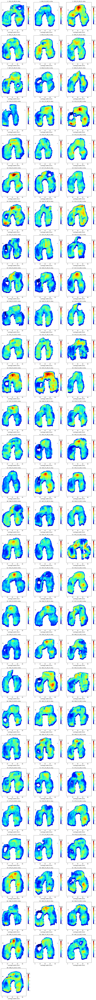

In [9]:
morph.show_thickness_maps(image_data)

#### GRAPH: Dots represent the average value of cartilage thickness per image; bars represents the standard deviation

<Figure size 1296x576 with 0 Axes>

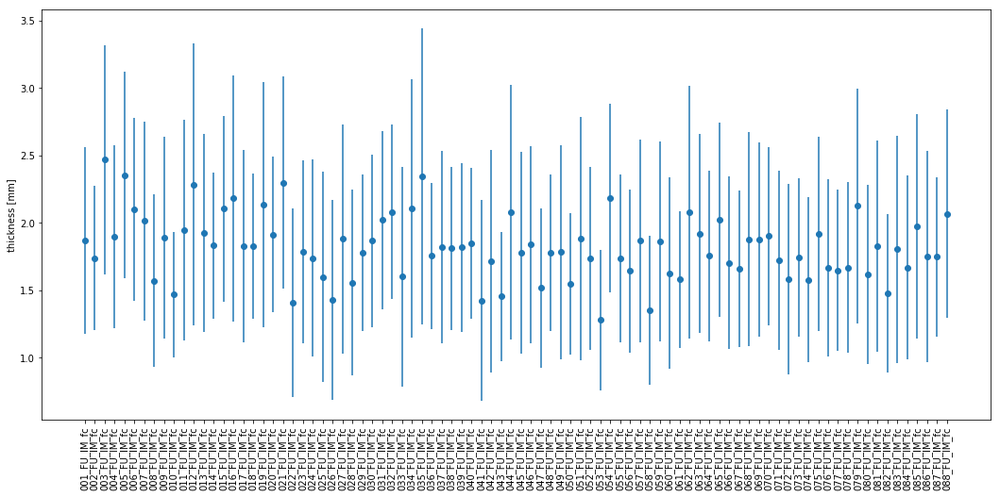

In [10]:
morph.show_thickness_graph(image_data)

#### TABLE: Average and standard deviation of cartilage thickness per image
The table is saved as a .csv file for subsequent analyisis

In [11]:
table = morph.show_thickness_table(image_data, output_file_name_thickness)
display(table)

Table saved as: thickness_OAI2_FU_IM.csv


,Subjects,averageThickness,std.dev
1,001_FU_IM_fc_thickness_1,1.87,0.69
2,002_FU_IM_fc_thickness_1,1.74,0.54
3,003_FU_IM_fc_thickness_1,2.47,0.85
4,004_FU_IM_fc_thickness_1,1.90,0.68
5,005_FU_IM_fc_thickness_1,2.35,0.77
6,006_FU_IM_fc_thickness_1,2.10,0.68
7,007_FU_IM_fc_thickness_1,2.01,0.74
8,008_FU_IM_fc_thickness_1,1.57,0.64
9,009_FU_IM_fc_thickness_1,1.89,0.75
10,010_FU_IM_fc_thickness_1,1.47,0.47


---

## Cartilage Volume

Calculate cartilage volume

In [12]:
morph.calculate_volume(image_data)

001_FU_IM_fc.mha
002_FU_IM_fc.mha
003_FU_IM_fc.mha
004_FU_IM_fc.mha
005_FU_IM_fc.mha
006_FU_IM_fc.mha
007_FU_IM_fc.mha
008_FU_IM_fc.mha
009_FU_IM_fc.mha
010_FU_IM_fc.mha
011_FU_IM_fc.mha
012_FU_IM_fc.mha
013_FU_IM_fc.mha
014_FU_IM_fc.mha
015_FU_IM_fc.mha
016_FU_IM_fc.mha
017_FU_IM_fc.mha
018_FU_IM_fc.mha
019_FU_IM_fc.mha
020_FU_IM_fc.mha
021_FU_IM_fc.mha
022_FU_IM_fc.mha
023_FU_IM_fc.mha
024_FU_IM_fc.mha
025_FU_IM_fc.mha
026_FU_IM_fc.mha
027_FU_IM_fc.mha
028_FU_IM_fc.mha
029_FU_IM_fc.mha
030_FU_IM_fc.mha
031_FU_IM_fc.mha
032_FU_IM_fc.mha
033_FU_IM_fc.mha
034_FU_IM_fc.mha
035_FU_IM_fc.mha
036_FU_IM_fc.mha
037_FU_IM_fc.mha
038_FU_IM_fc.mha
039_FU_IM_fc.mha
040_FU_IM_fc.mha
041_FU_IM_fc.mha
042_FU_IM_fc.mha
043_FU_IM_fc.mha
044_FU_IM_fc.mha
045_FU_IM_fc.mha
046_FU_IM_fc.mha
047_FU_IM_fc.mha
048_FU_IM_fc.mha
049_FU_IM_fc.mha
050_FU_IM_fc.mha
051_FU_IM_fc.mha
052_FU_IM_fc.mha
053_FU_IM_fc.mha
054_FU_IM_fc.mha
055_FU_IM_fc.mha
056_FU_IM_fc.mha
057_FU_IM_fc.mha
058_FU_IM_fc.mha
059_FU_IM_fc.m

### Visualizing cartilage volume

#### GRAPH: Dots represent cartilage volume per image

<Figure size 1296x576 with 0 Axes>

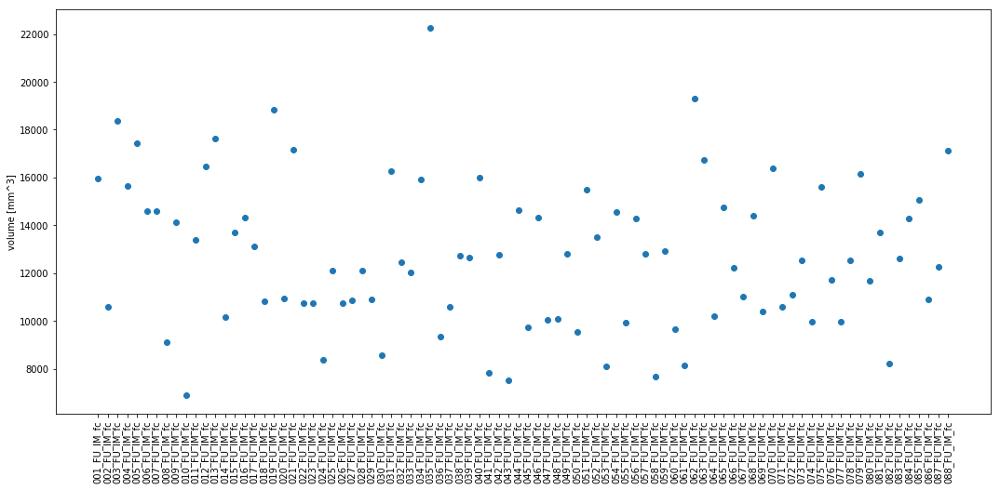

In [13]:
morph.show_volume_graph(image_data)

#### TABLE: Cartilage volume per image
The table is saved as a .csv file for subsequent analyisis

In [14]:
table = morph.show_volume_table(image_data, output_file_name_volume)
display(table)

Table saved as: volume_OAI2_FU_IM.csv


,Subjects,Volume
1,001_FU_IM_fc,15954
2,002_FU_IM_fc,10607
3,003_FU_IM_fc,18367
4,004_FU_IM_fc,15661
5,005_FU_IM_fc,17441
6,006_FU_IM_fc,14598
7,007_FU_IM_fc,14611
8,008_FU_IM_fc,9099
9,009_FU_IM_fc,14147
10,010_FU_IM_fc,6886


### References

[1] Maier J., Black M., Bonaretti S., Bier B., Eskofier B., Choi JH., Levenston M., Gold G., Fahrig R., Maier A. [*Comparison of Different Approaches for Measuring Tibial Cartilage Thickness.*](https://www.ncbi.nlm.nih.gov/pubmed/28753537) J Integr Bioinform. Jul 28;14(2). 2017.  
[2] Monu U.D., Jordan C.D., Samuelson B.L., Hargreaves B.A., Gold G.E., McWalter E.J. [*Cluster analysis of quantitative MRI $T_{2}$ and $T_{1\rho}$ relaxation times of cartilage identifies differences between healthy and ACL-injured individuals at 3T.*](https://www.ncbi.nlm.nih.gov/pubmed/27720806) Osteoarthritis Cartilage. Apr;25(4):513-520. 2017.   

### Dependencies

In [15]:
%load_ext watermark
%watermark -v -m -p SimpleITK,matplotlib,numpy,pandas,skimage,scipy,multiprocessing

CPython 3.6.1
IPython 6.4.0

SimpleITK unknown
matplotlib 2.2.2
numpy 1.14.5
pandas 0.23.4
skimage 0.14.1
scipy 1.1.0
multiprocessing unknown

compiler   : GCC 4.8.5 20150623 (Red Hat 4.8.5-11)
system     : Linux
release    : 3.10.0-862.14.4.el7.x86_64
machine    : x86_64
processor  : x86_64
CPU cores  : 20
interpreter: 64bit
